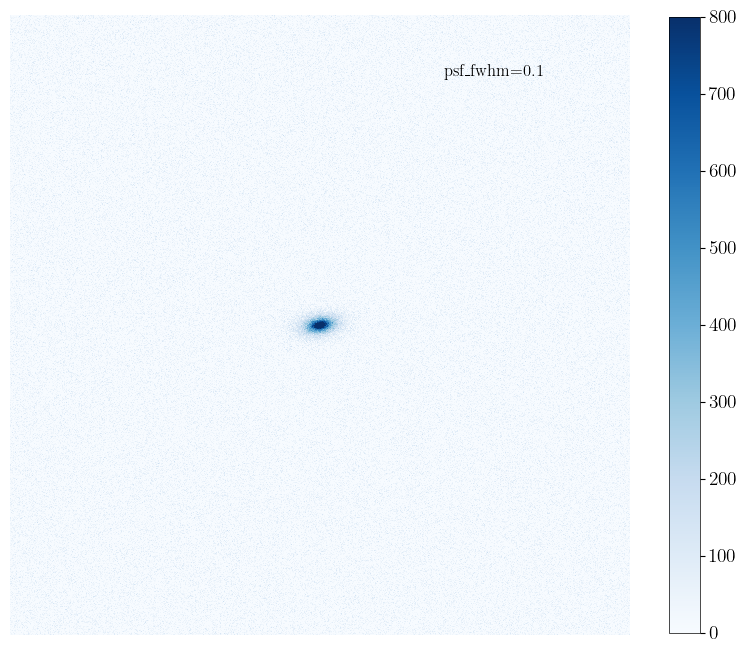

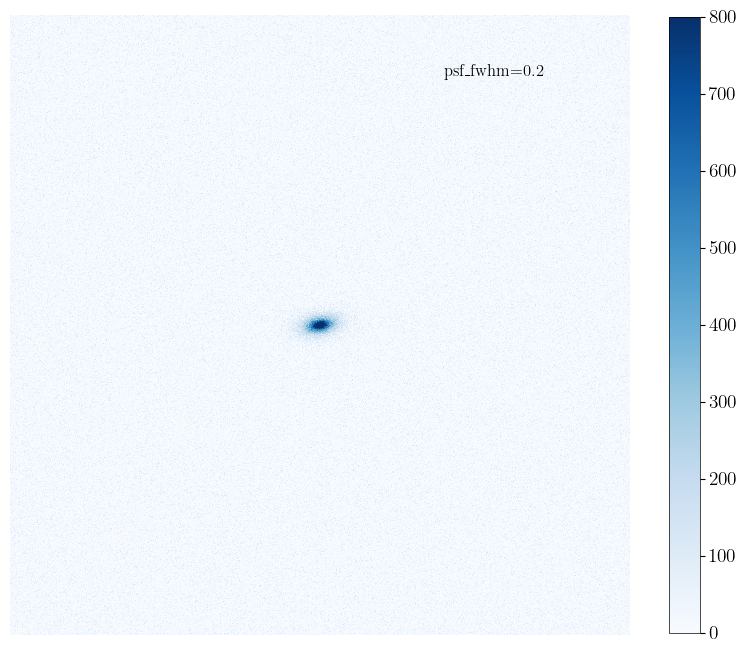

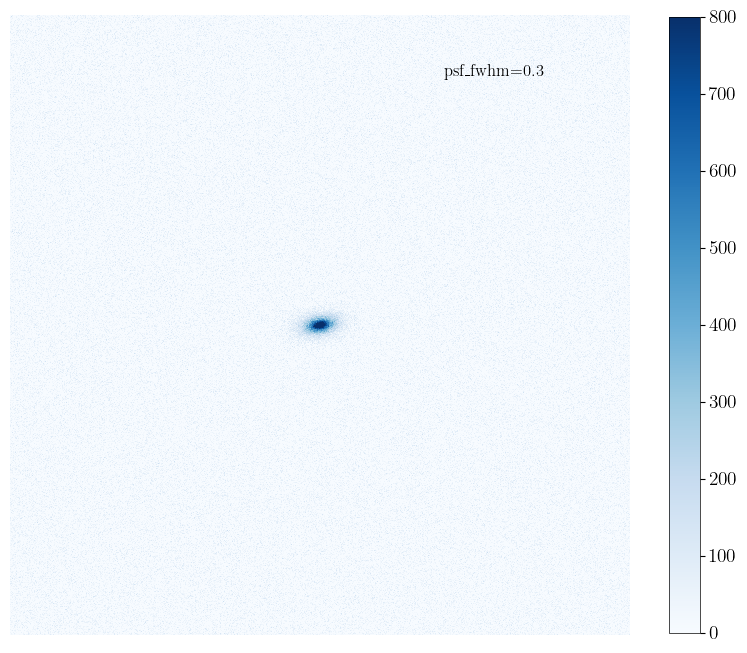

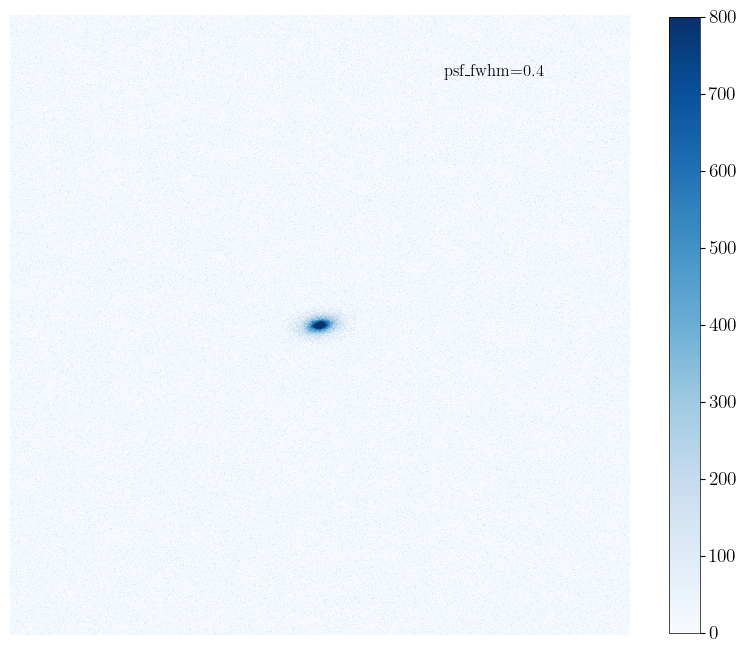

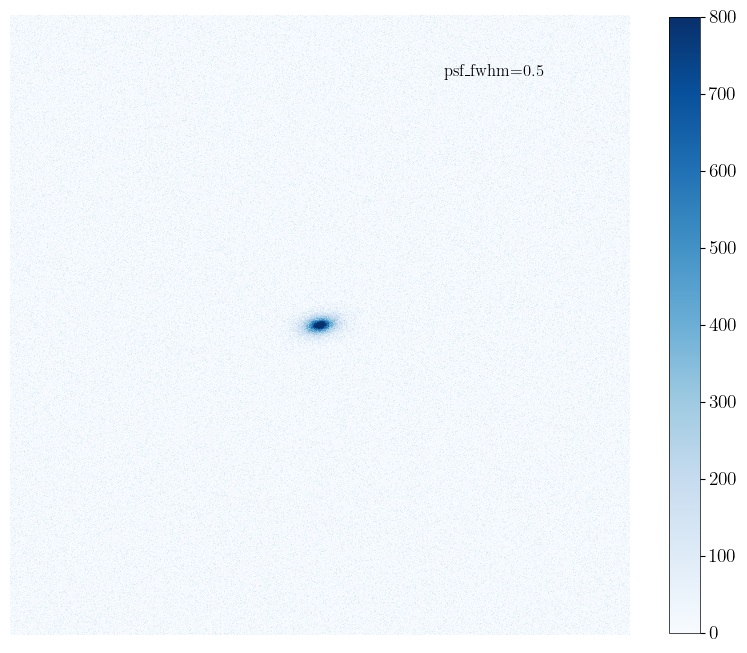

...

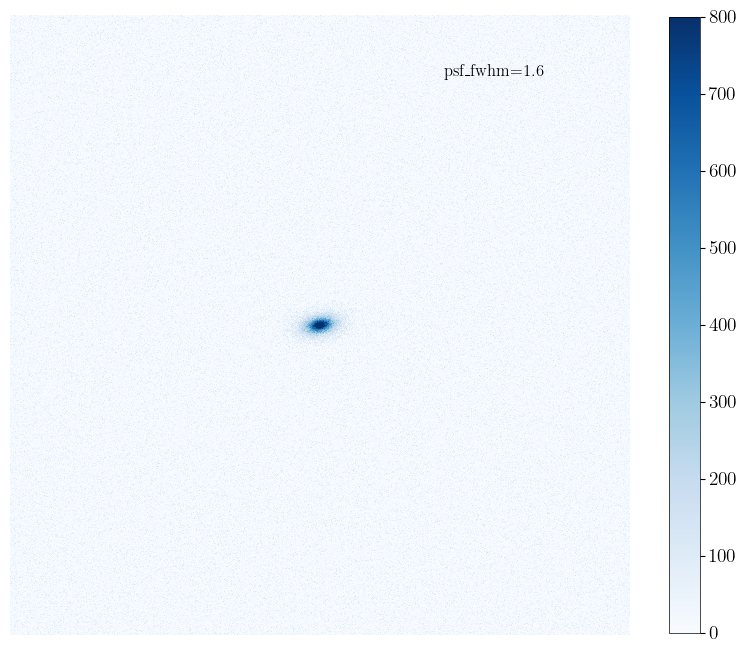

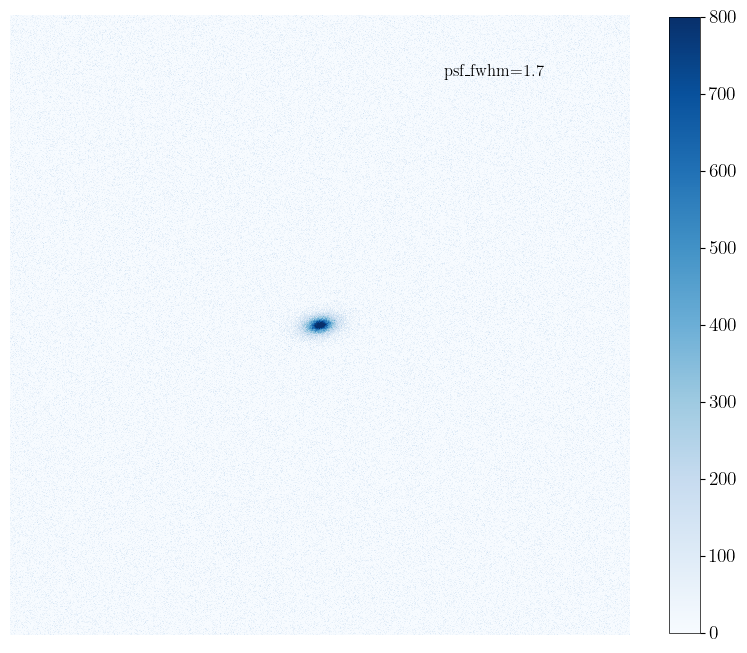

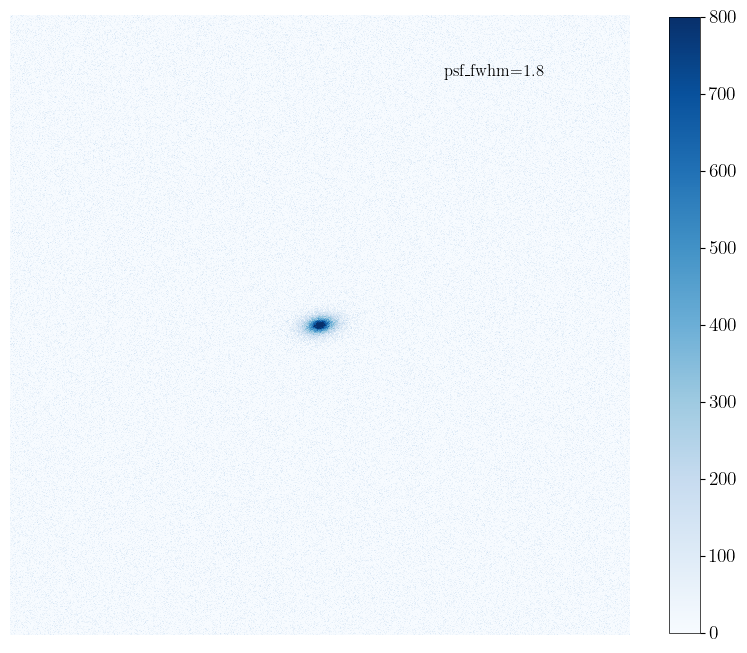

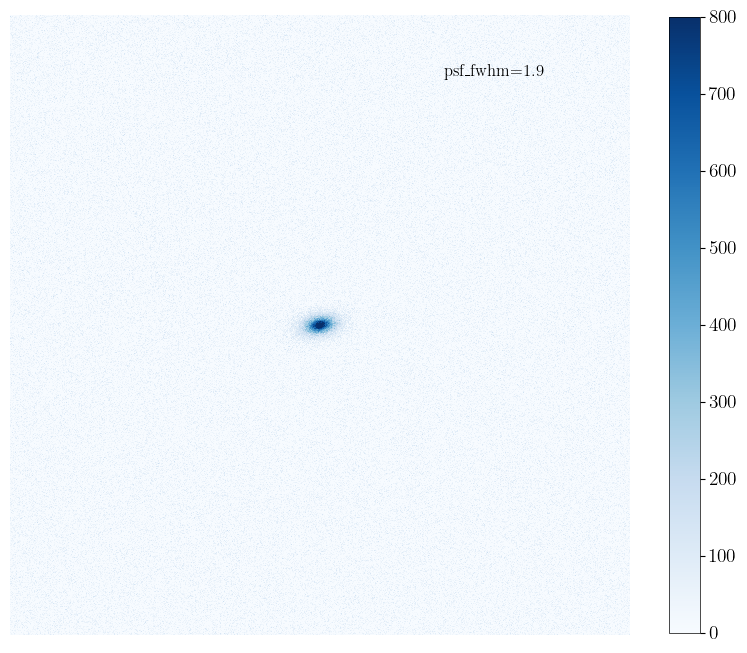

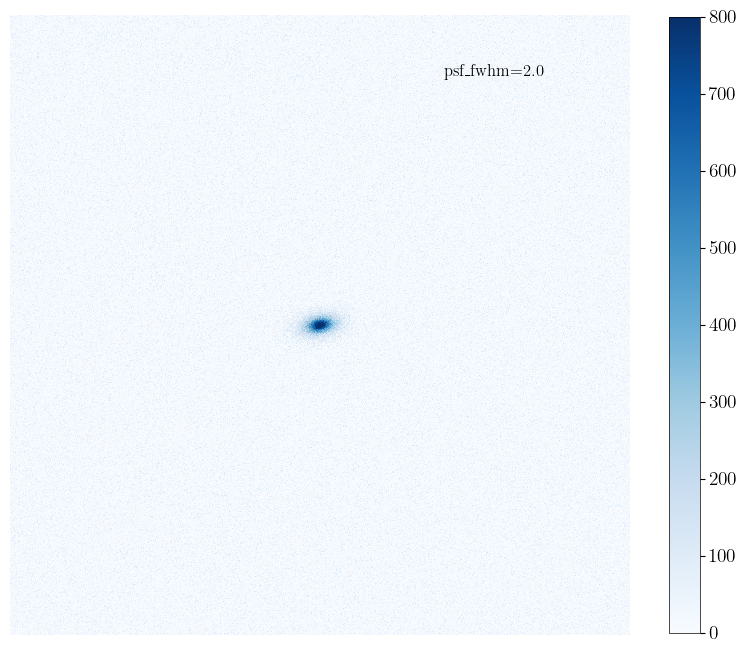

In [1]:
import numpy as np
import galsim
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib

#(optional) set the text font to Latex font. 
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer modern"],  
    "axes.labelsize": 14,     
    "axes.linewidth": 0.5,    
    "xtick.labelsize": 14,    
    "ytick.labelsize": 14,   
    "legend.fontsize": 12,    
    "legend.handlelength": 2.0
})

#set the galaxy parameters
gal_flux = 1.e6    
gal_r0 = 2.7       
g1 = 0.3           
g2 = 0.1                
pixel_scale = 0.26  
sky_level = 2.5e4
psf_fwhm=0
psf_fwhm_max = 2


image_size_x, image_size_y = 1000,1000 #for a more realistic size, use the DECam size 2048x4096 (https://noirlab.edu/science/programs/ctio/instruments/Dark-Energy-Camera/characteristics)

for i in range(0, 10 * psf_fwhm_max):
    
    psf_fwhm += 0.1

    random_seed = galsim.BaseDeviate(76433).raw()

    rng = galsim.BaseDeviate(random_seed + 1)

    gal = galsim.Exponential(flux=gal_flux, scale_radius=gal_r0)

    gal = gal.shear(g1=g1, g2=g2)
    
    

    psf = galsim.Gaussian(fwhm=psf_fwhm, flux=1.,)

    final = galsim.Convolve([gal, psf])
    
    
    image = galsim.ImageF(image_size_x, image_size_y, scale=pixel_scale)
    final.drawImage(image=image)

    sky_level_pixel = sky_level * pixel_scale**2
    noise = galsim.PoissonNoise(rng, sky_level=sky_level_pixel)
    image.addNoise(noise)



    plt.figure(figsize=(10, 10))
    img = plt.imshow(image.array, interpolation='none', cmap='Blues', vmin=0, vmax=800)

    plt.text(0.7 * image_size_x, 0.9 * image_size_y, 'psf_fwhm=' + str(round(psf_fwhm, 1)), size=12)
    plt.axis('on')


    plt.xlim(0, image_size_x)
    plt.ylim(0, image_size_y)
    plt.axis('off')
    plt.colorbar(shrink=0.8)
    #plt.savefig("psf_fwhm=%.1f.png" % psf_fwhm, bbox_inches='tight') #uncomment to be able to save each file and convert it into a gif
    plt.show()


    
